# Geometric Operations on Images

In this tutorial we will cover the following:
* Scaling
* General Affine Transformation
    * Translation
    * Rotation
    * Shear
    * Scaling
    * Finding the transform between two images
* Perspective Transformation

---

## Standard Imports

In [17]:
import cv2
import numpy as np
from tutorial_utils.utils import *
from matplotlib import pyplot as plt
DATA_DIR = data_dir()

---

## Scaling

Scaling means resizing of the image. OpenCV provides `cv2.resize()` for this purpose. 
* You can choose to specify the target dimensions after scaling, or you can specify the scaling factors in either or both directions (X, Y)
* You can also choose an interpolation method. This is used to infer pixel values after resizing. The below illustration shows how this works.

---

### Increasing the Image Size

When increasing the image size, the original pixels move further apart, leading to 'gaps' (shown in grey) in pixels that need to be inferred. Interpolation helps infer the value of those 'gap' pixels. 

For example, if the two left pixels in the left image (before resizing) had values 0 and 1, then after resizing, the left middle pixel would have a value of 0.5 (assuming linear interpolation). 

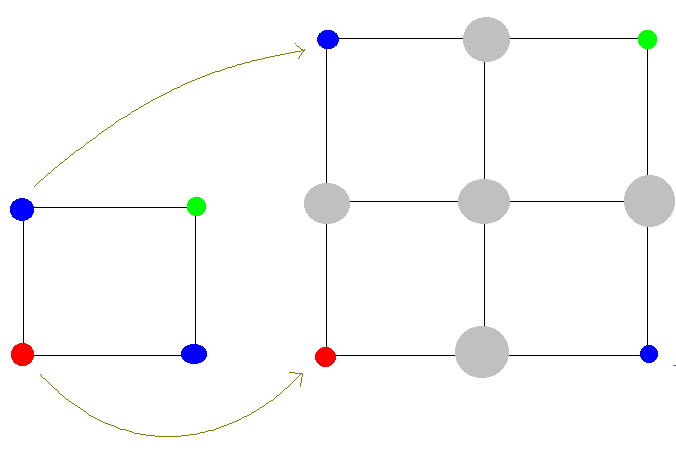

---

### Decreasing the Image Size

When decreasing the image size, the pixels move closer, so some pixels need to either be discarded, or groups of pixels need to be 'averaged' to get the final intensities.

For example, one could simply delete all the 'grey' pixels from the left image to get the right image. This would preserve the colors of the pixels.


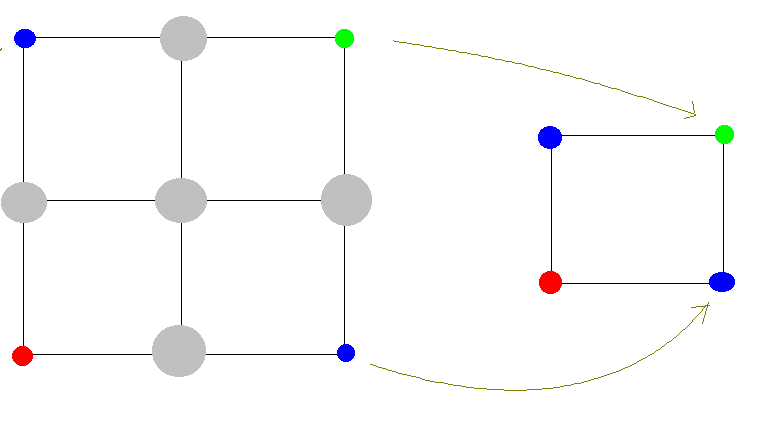

Alternatively, one could compute the intensity of the top-left pixel as the average of the middle-left and top-left. Similarly the intensity could be computed for all other pixels. This would potentially change the colors of the pixels. 


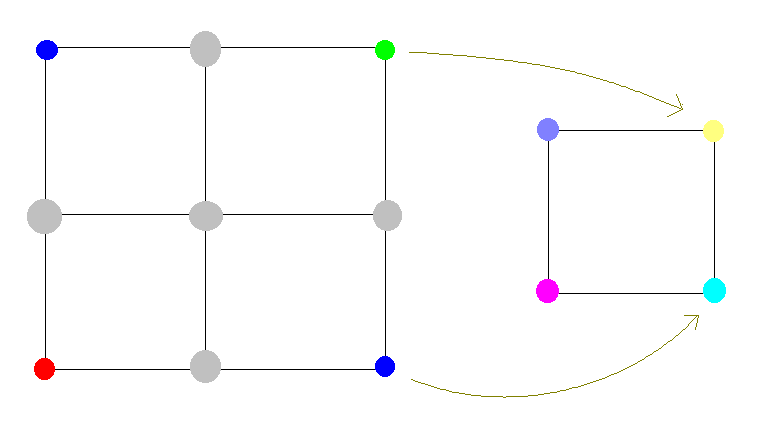

---

### Interpolation Methods

Here is a list of all available interpolation methods.

* `cv2.INTER_LINEAR`, for linear interpolation, is the Default method for all resizing
* `cv2.INTER_AREA` is recommended for Shrinking operations
* `cv2.INTER_LINEAR` and `cv2.INTER_CUBIC` (slower) is recommended for Expanding operations

In [18]:
interp = [i for i in dir(cv2) if i.startswith('INTER_')]
interp

['INTER_AREA',
 'INTER_BITS',
 'INTER_BITS2',
 'INTER_CUBIC',
 'INTER_LANCZOS4',
 'INTER_LINEAR',
 'INTER_LINEAR_EXACT',
 'INTER_MAX',
 'INTER_NEAREST',
 'INTER_NEAREST_EXACT',
 'INTER_TAB_SIZE',
 'INTER_TAB_SIZE2']

---

### Example

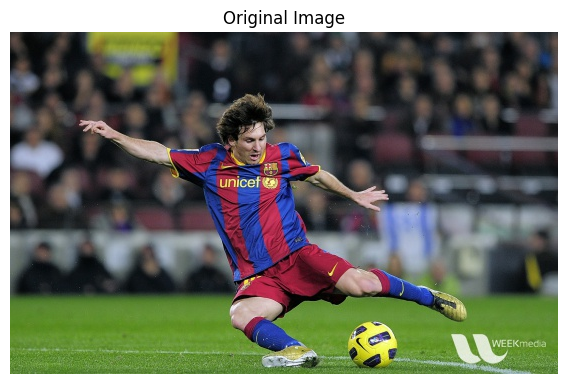

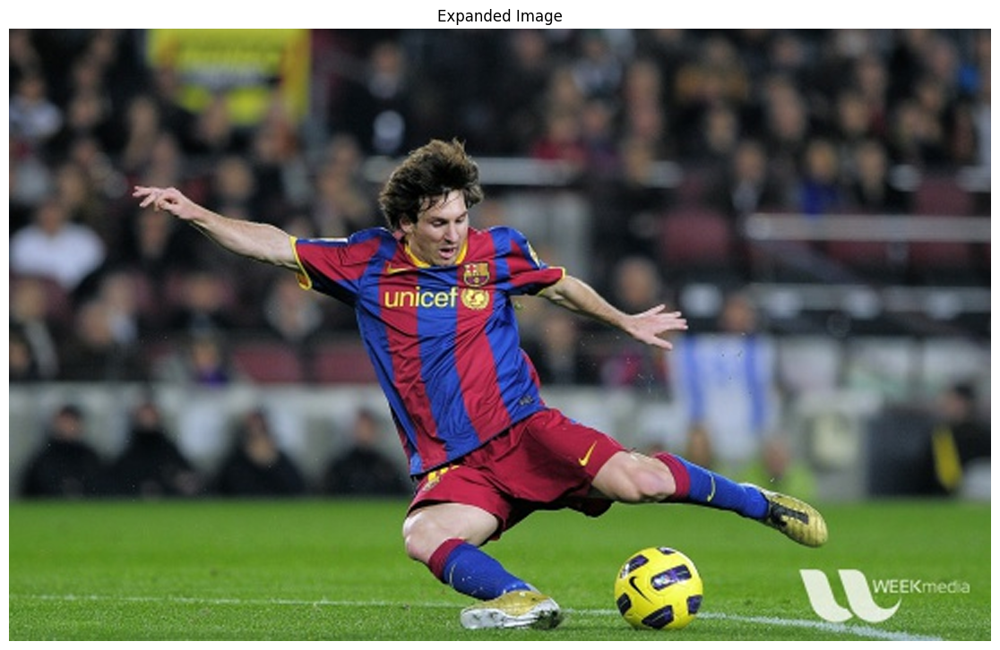

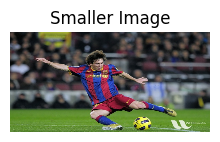

In [19]:
img = cv2.imread(DATA_DIR + "messi5.jpg")
cv2_imshow(img, "Original Image")

# Expand the image size by a scale factor of 2 in both directions
# This is called Implicit Scaling
larger = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
cv2_imshow(larger, "Expanded Image")

# Shrink the image to a given size
# This is called Explicit Scaling 
smaller = cv2.resize(img, (200, 100))
cv2_imshow(smaller, "Smaller Image")

---

## General Affine Transformation

In an affine transformation, all parallel lines are preserved, but not necessarily angles or distances. Here is the  [Wiki](https://en.wikipedia.org/wiki/Affine_transformation) if you are interested.

Affine transforms include Translation, Rotation, Shear and even Scaling.

For a 2D image, any affine transform can be represented using a transformation matrix:

$M = \begin{bmatrix}a & b & t_{x}\\ c & d & t_{y}\end{bmatrix}$

It is recommended to make the transform matrix as a `np.float32` matrix.


OpenCV provides the `cv2.warpAffine()` method that takes the following arguments:
* Input Image
* Transform Matrix M
* Output image dimensions (width, height)


---

### Translation

Translation is the shifting of an objects location. If you know the shift in the X, Y direction (let these be $t_{x}$ and $t_{y}$), then the transformation matrix is:

$M = \begin{bmatrix}1 & 0 & t_{x}\\ 0 & 1 & t_{y}\end{bmatrix}$

---

#### Example


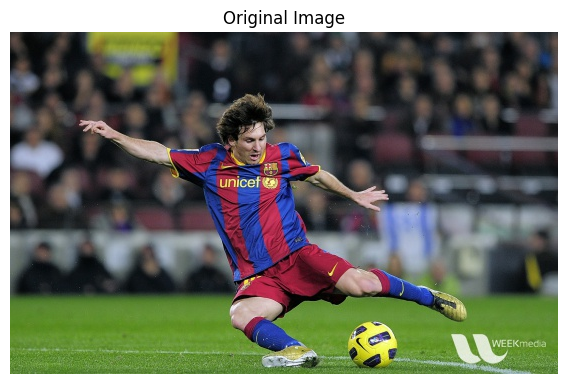

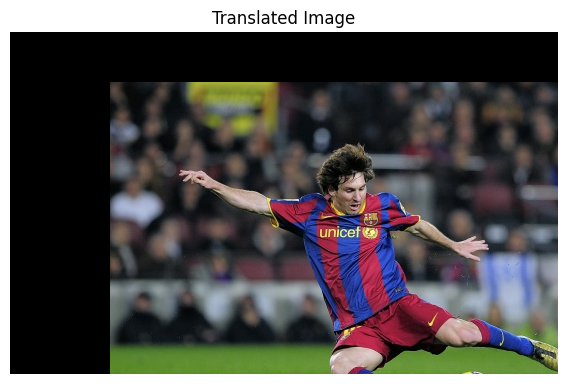

In [20]:
img = cv2.imread(DATA_DIR + "messi5.jpg")
cv2_imshow(img, "Original Image")

height, width = img.shape[:2]
tx, ty = 100, 50
SHIFT_MATRIX = np.float32([[1, 0, tx],[0, 1, ty]])

translated = cv2.warpAffine(img, SHIFT_MATRIX, (width, height))
cv2_imshow(translated, "Translated Image")

---

### Rotation

Rotation of an image for an angle $\theta$ is achieved by the transformation matrix of the form:

$M = \begin{bmatrix}cos \theta & -sin \theta & 0\\ sin \theta & cos \theta & 0\end{bmatrix}$

OpenCV lets you rotate about ANY center of rotation, and also simultaneously scale the image. The transformation matrix for this is given by:

$M = \begin{bmatrix}\alpha & \beta & (1-\alpha) \cdot c_{x} - \beta \cdot c_{y}\\-\beta & \alpha &  \beta \cdot c_{x} + (1-\alpha) \cdot c_{y}\end{bmatrix}$

where $c_{x}, c_{y}$ are the coordinates of the center point, $\alpha = scale \cdot cos \theta$ and $\beta = scale \cdot sin \theta$



To find this transformation matrix, OpenCV provides `cv2.getRotationMatrix2D()`. This function takes the following arguments:
* Rotation Center point
* Angle in degrees
* Scale

Note that the 'scale' in the transformation matrix won't increase the size of the image. When you rotate an image, some portions of it might go outside the original image dimensions ('canvas'). If you want the rotated image to stay inside the canvas, you need to increase the size of the canvas, and maybe also translate the rotated image a bit. This is demonstrated below.


---

#### Example

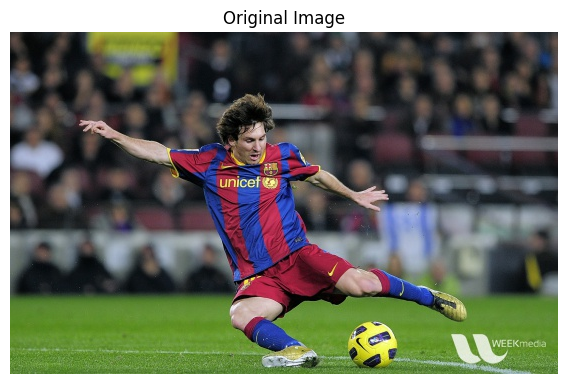

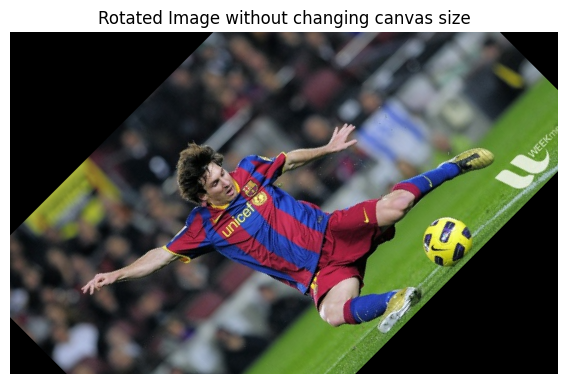

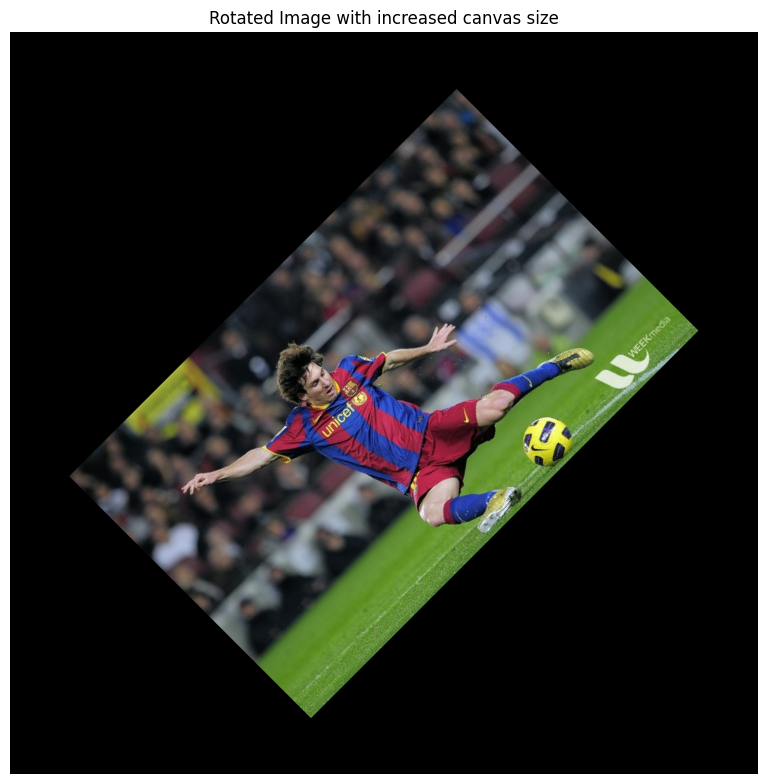

In [21]:
img = cv2.imread(DATA_DIR + "messi5.jpg")
cv2_imshow(img, "Original Image")

height, width = img.shape[:2]

center = (width // 2, height // 2)
angle = 45
scale = 1.0

ROTATION_MATRIX = cv2.getRotationMatrix2D(center, angle, scale)

rotated = cv2.warpAffine(img, ROTATION_MATRIX, (width, height))
cv2_imshow(rotated, "Rotated Image without changing canvas size")

ROTATION_MATRIX[0, 2] += 100 # Shift to the right so it is centered about the increased canvas
ROTATION_MATRIX[1, 2] += 200 # Shift down so it is centered about the increased canvas
rotated_larger = cv2.warpAffine(img, ROTATION_MATRIX, (width+200, height+400))
cv2_imshow(rotated_larger, "Rotated Image with increased canvas size")

---

### Shearing

Shearing skews an object along one or both axes, preserving parallelism but not angles.  If you know the skew factors in the X, Y direction (let these be $r_{x}$ and $r_{y}$), then the transformation matrix is:

$M = \begin{bmatrix}1 & r_{x} & 0\\ r_{y} & 1 & 0\end{bmatrix}$


**Note**: Do NOT set $r_{x}$ and $r_{y}$ BOTH to 1, otherwise you get what is called a 'singular matrix'. This would do a 'dimension reduction'; every point (x,y) in the 2D plane (image) is mapped onto a single line (y = x). So you won't see anything in the image.


---

#### Example

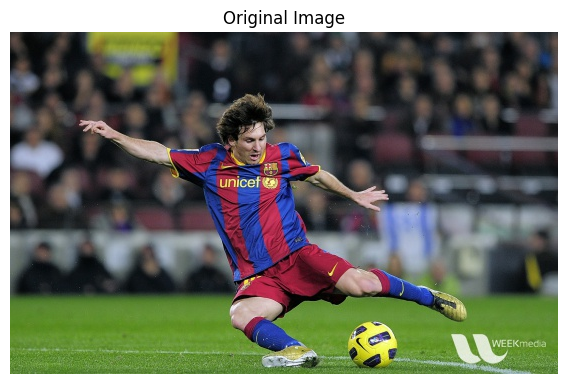

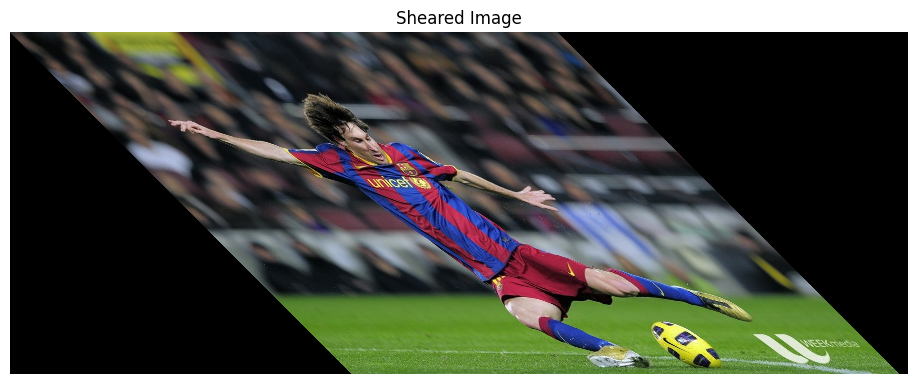

In [22]:
img = cv2.imread(DATA_DIR + "messi5.jpg")
cv2_imshow(img, "Original Image")

height, width = img.shape[:2]
rx, ry = 1, 0
SHEAR_MATRIX = np.float32([[1, rx, 0],[ry, 1, 0]])

sheared = cv2.warpAffine(img, SHEAR_MATRIX, (width + 350, height))
cv2_imshow(sheared, "Sheared Image")

---

### Scaling

Scaling performs a 'Zooming In/Out' effect on the contents of the image. 

Scaling won't change the size of the image by default. You will need to update the output dimensions in `warpAffine()` if you want the image size to also be enlarged/shrunk to fit the scaled image contents.

Scaling can be done using Affine Transform. In this case the transformation matrix becomes:

$M = \begin{bmatrix}s_{x} & 0 & 0\\ 0 & s_{y} & 0\end{bmatrix}$


--- 

#### Example



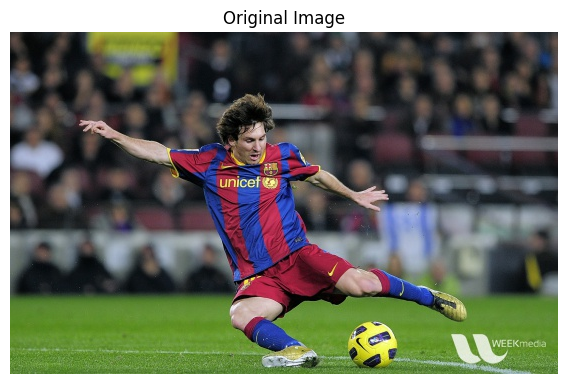

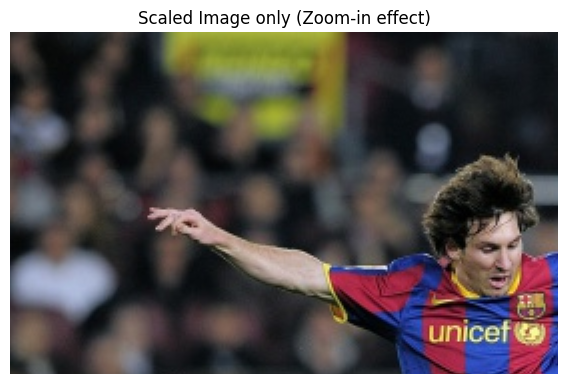

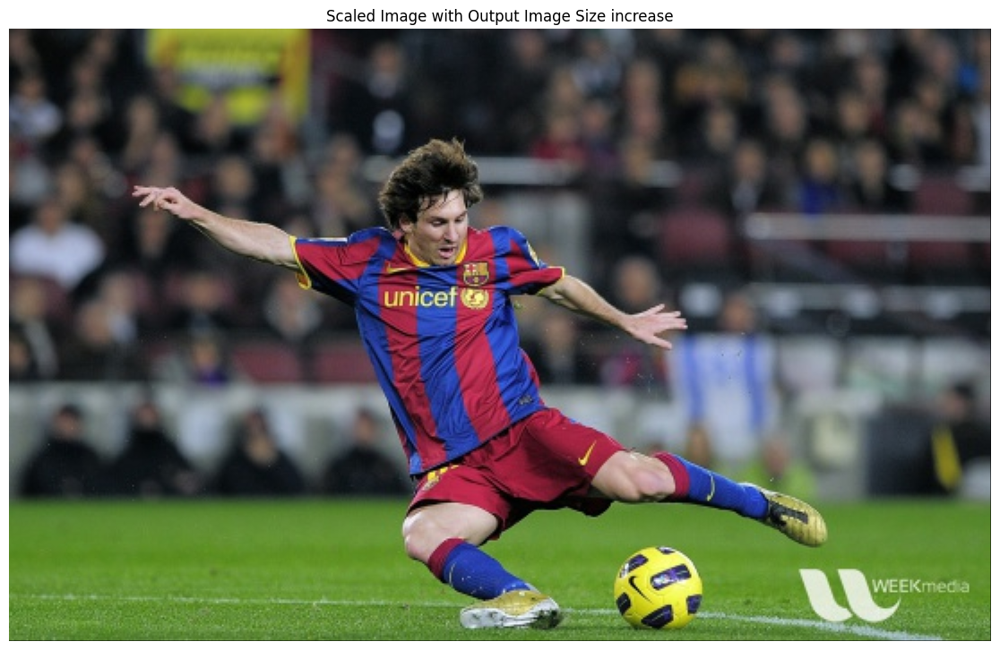

In [23]:
img = cv2.imread(DATA_DIR + "messi5.jpg")
cv2_imshow(img, "Original Image")

height, width = img.shape[:2]
sx, sy = 2, 2
SCALE_MATRIX = np.float32([[sx, 0, 0],[0, sy, 0]])

scaled = cv2.warpAffine(img, SCALE_MATRIX, (width, height))
cv2_imshow(scaled, "Scaled Image only (Zoom-in effect)")

scaled_img = cv2.warpAffine(img, SCALE_MATRIX, (2 *width, 2* height))
cv2_imshow(scaled_img, "Scaled Image with Output Image Size increase")

---

### Finding Affine Transforms between Two Images

Suppose you have some reference points of the same features/objects that are present in two different images. You can use that to compute the affine transformation between those two images.

OpenCV provides `cv2.getAffineTransform()` that takes **exactly 3 pairs of corresponding points** in the source and destination images.

---

#### Example



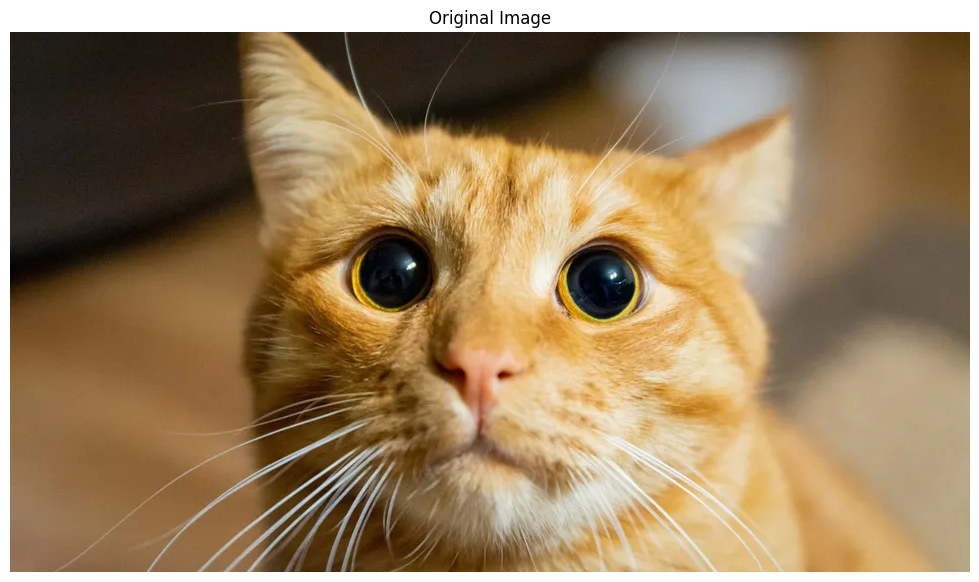

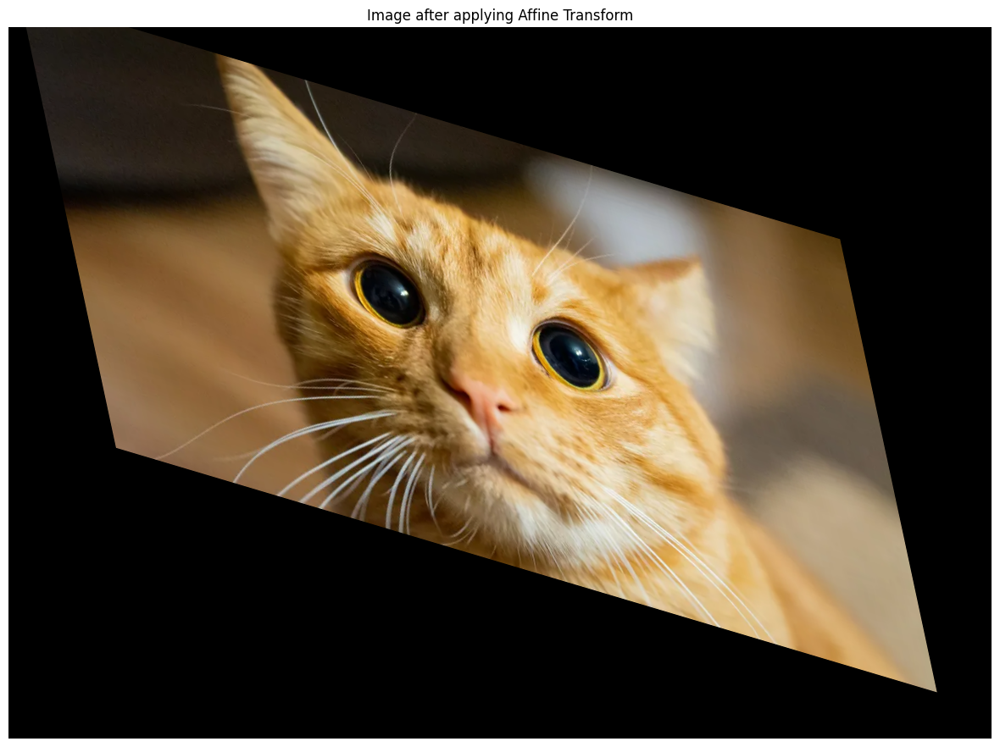

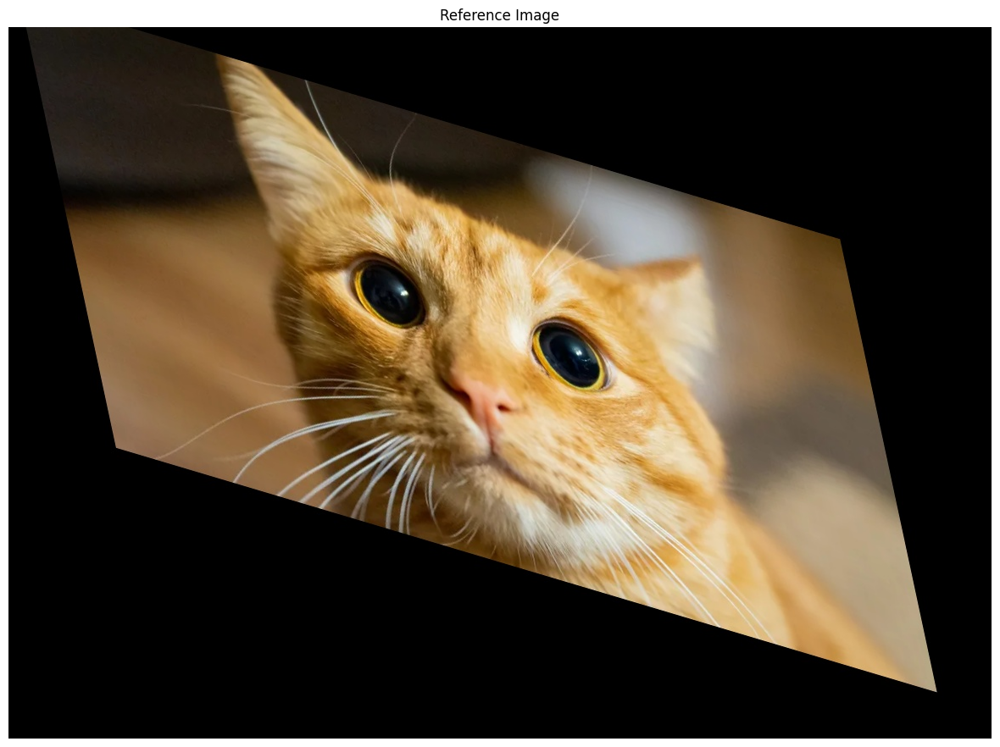

In [24]:
img = cv2.imread(DATA_DIR + "cat.jpg")
ref_img = cv2.imread(DATA_DIR + "cat_warped.jpg")
cv2_imshow(img, "Original Image")

height, width = img.shape[:2]

pts1 = np.float32([[400, 230], [600, 245], [470, 345]]) # Points on Image 1
pts2 = np.float32([[465, 310], [670, 385], [560, 445]]) # Corresponding points on Image 2

# Solve to get the transform
M = cv2.getAffineTransform(pts1,pts2)

# Verify that this is the correct transform
dst = cv2.warpAffine(img, M, (width + 200, height + 300))
cv2_imshow(dst, "Image after applying Affine Transform")

cv2_imshow(ref_img, "Reference Image")

---

## Perspective Transform

In a Perspective transform, the image is warped to mimic the effect of perspective, making objects appear smaller as they recede into the distance. This is used to simulate depth. In a Perspective transform, straight lines are preserved, but the relationships between them, like angles and distances, can change.

Unlike Affine Transformation, a Perspective transform is defined by a 3x3 matrix

$M = \begin{bmatrix}1 & 0 & 0\\ 0 & 1 & 0\\p_{x} & p_{y} & 1\end{bmatrix}$

OpenCV provides `cv2.warpPerspective()` to apply this matrix M onto an image. It takes as arguments:
* The input image
* Transform matrix M
* Output image size (width, height)

Suppose we have two images and we want to find the perspective transform between them. OpenCV provides `cv2.getPerspectiveTransform()` for this. For this function, we need 4 points on the input image and 4 corresponding points on the output image. Of those 4 points, 3 of them should not be collinear.

---

### Example

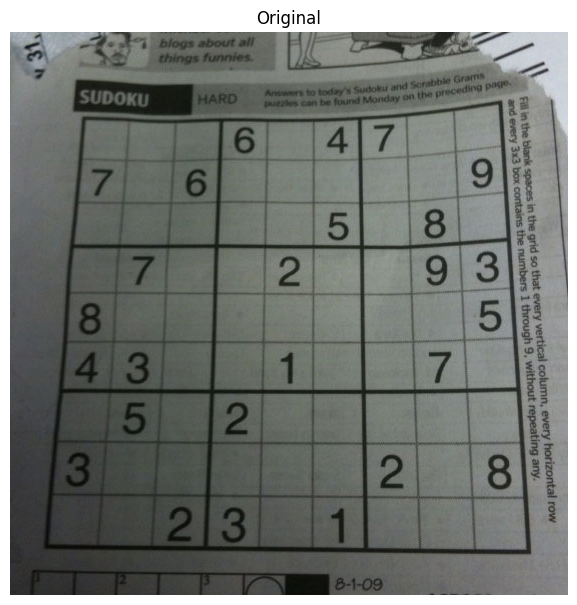

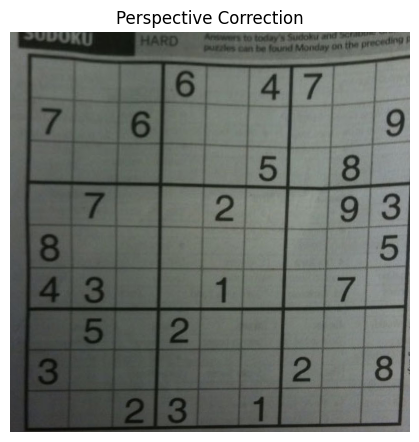

In [25]:
img = cv2.imread(DATA_DIR + 'sudoku.png')
height, width = img.shape[:2]

pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]]) # Points on source image
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]]) # Corresponding Points on desired/target image
 
M = cv2.getPerspectiveTransform(pts1,pts2)
 
dst = cv2.warpPerspective(img,M,(400,400))

cv2_imshow(img, "Original")
cv2_imshow(dst, "Perspective Correction")

---

### Intuition behind Perspective Transforms

**Disclaimer:** This is a very simplified explanation meant to built intuition.

When 3D objects are projected onto a 2D image plane, the projection would need to 'preserve' the depth information somehow, otherwise there is loss of information. Imagine looking at railroad tracks going straight away from you. The railroad tracks are parallel in the 3D world, but to our eyes, they appear to eventually converge at some far-away point.



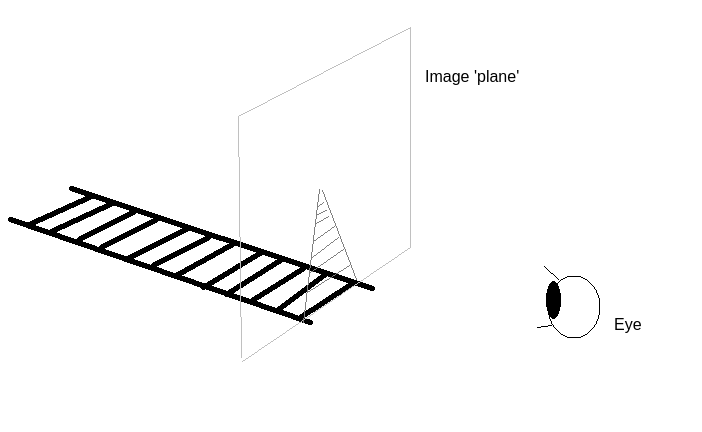

The below image is a side view of the above image. It shows how light rays travel from points on the track at various distances, to our eyes. You can see why the further-away points tend to get closer and smaller, eventually converging at a point. This is called a 'vanishing point'.

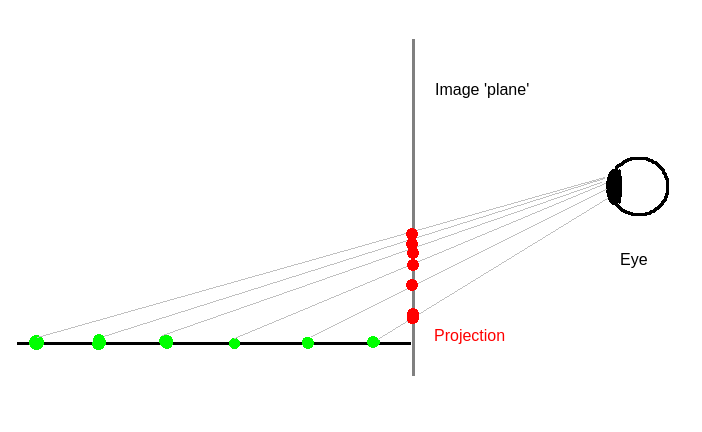

Suppose each point/pixel on the image is represented by the homogeneous coordinate $\begin{bmatrix}x \\ y \\ 1\end{bmatrix}$

Assuming no other transformations, the perspective transform matrix is 

$M = \begin{bmatrix}1 & 0 & 0\\ 0 & 1 & 0\\p_{x} & p_{y} & 1\end{bmatrix}$

If we multiply the two we get,

$M \cdot \begin{bmatrix}x \\ y \\ 1\end{bmatrix} = \begin{bmatrix}x \\ y \\ W\end{bmatrix}$

In order for this result to be consistent with the 2D image coordinates, we divide it by W.

$\begin{bmatrix}x' \\ y' \\ 1\end{bmatrix} = \begin{bmatrix}x/W \\ y/W \\ W/W\end{bmatrix}$

Now, $W = p_{x} \cdot x + p_{y} \cdot y + 1$

So we have,

$x' = \frac{x}{p_{x} \cdot x + p_{y} \cdot y + 1}$

$y' = \frac{y}{p_{x} \cdot x + p_{y} \cdot y + 1}$


When there is no perspective transform, $p_{x} = p_{y} = 0$ so this matrix would simply be an identity transform and there is no depth information.

But $p_{x}$ and $p_{y}$ encode this depth information. 

For example, suppose $p_{x} = 0.01, p_{y} = 0.01$.
* (0,0) remains the same
* (1,1) becomes $(\frac{1}{1.02}, \frac{1}{1.02}) = (0.98, 0.98)$
* (100, 100) becomes $(\frac{100}{3}, \frac{100}{3}) = (33.3, 33.3)$
* (1000, 1000) becomes $(\frac{1000}{21}, \frac{1000}{21}) = (47.6, 47.6)$

So this appears as if the right side of the image is going deeper / further away into the 3D world. Since the origin of the image is at the top-left, it looks like the bottom of the image is deeper / further away into the 3D world.
